# Q1: SIFT Keypoint Matching


In [1]:
import numpy as np
import cv2
import math
import random

Contents of solution.py

In [2]:
def ComputeAngDiffInDeg0To180(angleInRad):
    """
    Given angular difference in radians in [-inf, inf],
    returns anglular difference in degrees in [0, 180].
    """
    # map to [0, 2*pi]
    angleInRad0to2Pi = angleInRad % (2*math.pi)
    # map to [0, 360]
    angleInDeg0to360 = math.degrees(angleInRad0to2Pi)
    # map to [0, 180]
    angleInDeg0to180 = angleInDeg0to360
    if angleInDeg0to360 > 180.0:
        angleInDeg0to180 = 360.0 - angleInDeg0to360
    return angleInDeg0to180

# test code for ComputeAngDiffInDeg0To180
assert np.linalg.norm(ComputeAngDiffInDeg0To180(0.5*math.pi)-90.0) < 1e-9
assert np.linalg.norm(ComputeAngDiffInDeg0To180(2.25*math.pi)-45.0) < 1e-9
assert np.linalg.norm(ComputeAngDiffInDeg0To180(-0.5*math.pi)-90.0) < 1e-9
assert np.linalg.norm(ComputeAngDiffInDeg0To180(-2.25*math.pi)-45.0) < 1e-9


def ComputeDiffs(pair, keypoints1, keypoints2):
    """
    Computes and returns the orientation and scale difference between
    keypoints1 and keypoints2.
    Inputs:
        pair: a tuple (i, j), indicating keypoints1[i] is matched
            with keypoints2[j]
        keypoints1, 2: keypoints from image 1 and image 2
            stored in np.array with shape (num_pts, 4)
            each row: row, col, scale, orientation. Orientation
            measured in radians
    Output:
        tuple (o_diff, s_diff) for orientation and scale difference.
        o_diff is angle(keypoints2[j]) - angle(keypoints1[i]), measured
        in degrees, in the range [0, 180];
        s_diff is scale(keypoints2[j])/scale(keypoints1[i]).
    """
    # retrieve orientations in radians in the range [-inf, inf]
    angle_i = keypoints1[pair[0], 3]
    angle_j = keypoints2[pair[1], 3]

    # compute angular difference in degrees, in the range [0, 180]
    o_diff = ComputeAngDiffInDeg0To180(angle_j - angle_i)

    # compute scale difference
    s_diff = keypoints2[pair[1], 2] / keypoints1[pair[0], 2]
    return (o_diff, s_diff)


def RANSACFilter(
        matched_pairs, keypoints1, keypoints2,
        orient_agreement, scale_agreement):
    """
    This function takes in `matched_pairs`, a list of matches in indices
    and return a subset of the pairs using RANSAC.
    Inputs:
        matched_pairs: a list of tuples [(i, j)],
            indicating keypoints1[i] is matched
            with keypoints2[j]
        keypoints1, 2: keypoints from image 1 and image 2
            stored in np.array with shape (num_pts, 4)
            each row: row, col, scale, orientation
        *_agreement: thresholds for defining inliers, floats
    Output:
        largest_set: the largest consensus set in [(i, j)] format

    HINTS: the "*_agreement" definitions are well-explained
           in the assignment instructions.
    """
    assert isinstance(matched_pairs, list)
    assert isinstance(keypoints1, np.ndarray)
    assert isinstance(keypoints2, np.ndarray)
    assert isinstance(orient_agreement, float)
    assert isinstance(scale_agreement, float)
    ## START
    # if no matched pairs, quit
    if len(matched_pairs) == 0:
        return []

    # initialize largest set
    largest_set = []

    # do 10 times
    for iteration in range(0, 10):
        # randomly draw one pair out
        pair_index = random.randint(0, len(matched_pairs)-1)
        pair = matched_pairs[pair_index]

        # initialize temporary set
        temp_set = [pair]

        # compute orientation and scale difference
        o_diff, s_diff = ComputeDiffs(pair, keypoints1, keypoints2)
        #print(f"o_diff is {o_diff}, ")

        # for all other matched pairs
        for pair_other_index in range(0, len(matched_pairs)):
            if pair_other_index != pair_index:
                # select the pair
                pair_other = matched_pairs[pair_other_index]
                # compute orientation and scale difference
                o_diff_other, s_diff_other = ComputeDiffs(pair_other, keypoints1, keypoints2)
                # check consistency. If consistent, add to temp set
                if abs(o_diff_other - o_diff)<=orient_agreement and s_diff_other<=s_diff*(1.0+scale_agreement) and s_diff_other>=s_diff*(1.0-scale_agreement): 
                    temp_set.append(pair_other)
        
        #print(f"temp set size: {len(temp_set)}")
        # replace largest set so far with the temp set,
        # if the temp set is larger
        if len(temp_set)>len(largest_set):
            largest_set = temp_set
    print(f"largest set size: {len(largest_set)}")
    ## END
    assert isinstance(largest_set, list)
    return largest_set


def FindBestMatches(descriptors1, descriptors2, threshold):
    """
    This function takes in descriptors of image 1 and image 2,
    and find matches between them. See assignment instructions for details.
    Inputs:
        descriptors: a K-by-128 array, where each row gives a descriptor
        for one of the K keypoints.  The descriptor is a 1D array of 128
        values with unit length.
        threshold: the threshold for the ratio test of "the distance to the nearest"
                   divided by "the distance to the second nearest neighbour".
                   pseudocode-wise: dist[best_idx]/dist[second_idx] <= threshold
    Outputs:
        matched_pairs: a list in the form [(i, j)] where i and j means
                       descriptors1[i] is matched with descriptors2[j].
    """
    assert isinstance(descriptors1, np.ndarray)
    assert isinstance(descriptors2, np.ndarray)
    assert isinstance(threshold, float)
    ## START
    
    # produce candidate matches
    # get cos values
    cosValues = np.matmul(descriptors1, np.transpose(descriptors2))
    # get acos values of shape (K1, K2). Each element in range
    # [0, pi]
    simScores = np.arccos(cosValues)
    # initialize array of shape (K1, ) to represent matched pairs
    matchedPairsArr = np.argmin(simScores, axis=1)

    # eliminate false matches
    # sort simScores - index no longer corresponds to original order
    simScoresSorted = np.sort(simScores, axis=1)
    # produce a binary array of shape (K1, ) to represent if a match
    # is above the threshold
    assert simScoresSorted.shape[1] >= 2
    ifAboveThresh = simScoresSorted[:, 0]/simScoresSorted[:, 1] > threshold
    # mask the matched pair array to mark false matches
    matchedPairsArr[ifAboveThresh] = -1

    # resolve conflicts
    # TODO:    

    # assemble pairs and remove false matches
    matched_pairs = []
    matchedPairsWithFalse = [(i, matchedPairsArr[i]) for i in range(0, matchedPairsArr.shape[0])]
    for pair in matchedPairsWithFalse:
        if pair[1] != -1:
            matched_pairs.append(pair)
    print(f"number of matched pairs: {len(matched_pairs)}")
    
    ## END
    return matched_pairs


def KeypointProjection(xy_points, h):
    """
    This function projects a list of points in the source image to the
    reference image using a homography matrix `h`.
    Inputs:
        xy_points: numpy array, (num_points, 2)
        h: numpy array, (3, 3), the homography matrix
    Output:
        xy_points_out: numpy array, (num_points, 2), input points in
        the reference frame.
    """
    assert isinstance(xy_points, np.ndarray)
    assert isinstance(h, np.ndarray)
    assert xy_points.shape[1] == 2
    assert h.shape == (3, 3)

    # START
    # convert to homogeneous coordinates
    xy_points_homo_source = np.append(xy_points, np.ones((xy_points.shape[0], 1), dtype=np.float64), axis=1) # (num_points, 3)
    
    # project
    xy_points_homo_proj = np.transpose(np.matmul(h, np.transpose(xy_points_homo_source))) # (num_points, 3)
    
    # get the z componenets of projected points
    z = xy_points_homo_proj[:, -1]
    z[z == 0.0] = 1e-10 # (num_points, )
    z = np.repeat(np.expand_dims(z, axis=1), 2, axis=1) # (num_points, 2)
    
    # reduce to non-homo coordinates
    xy_points_out = xy_points_homo_proj[:, 0:-1] / z
    # END
    return xy_points_out

def RANSACHomography(xy_src, xy_ref, num_iter, tol):
    """
    Given matches of keyponit xy coordinates, perform RANSAC to obtain
    the homography matrix. At each iteration, this function randomly
    choose 4 matches from xy_src and xy_ref.  Compute the homography matrix
    using the 4 matches.  Project all source "xy_src" keypoints to the
    reference image.  Check how many projected keyponits are within a `tol`
    radius to the coresponding xy_ref points (a.k.a. inliers).  During the
    iterations, you should keep track of the iteration that yields the largest
    inlier set. After the iterations, you should use the biggest inlier set to
    compute the final homography matrix.
    Inputs:
        xy_src: a numpy array of xy coordinates, (num_matches, 2)
        xy_ref: a numpy array of xy coordinates, (num_matches, 2)
        num_iter: number of RANSAC iterations.
        tol: float
    Outputs:
        h: The final homography matrix.
    """
    assert isinstance(xy_src, np.ndarray)
    assert isinstance(xy_ref, np.ndarray)
    assert xy_src.shape == xy_ref.shape
    assert xy_src.shape[1] == 2
    assert isinstance(num_iter, int)
    assert isinstance(tol, (int, float))
    tol = tol*1.0

    # START
    # make sure we have at least 4 matches
    assert xy_src.shape[0] >= 4
    
    # initialize largest set size and final h matrix
    largest_set_size = 0
    h = None
    
    # fit for num_iter iterations
    for i in range(0, num_iter):
        
        # randomly draw out 4 matches
        selected_indices = np.random.randint(0, xy_src.shape[0], size=(4,))
        xy_src_selected = xy_src[selected_indices, :]
        xy_ref_selected = xy_ref[selected_indices, :]
        assert xy_src_selected.shape==(4, 2) and xy_ref_selected.shape==(4, 2)
        
        # compute h matrix from the 4 matches
        h_temp, _ = cv2.findHomography(xy_src_selected, xy_ref_selected)
        
        # project from source to reference
        xy_proj = KeypointProjection(xy_src, h_temp) # (num_matches, 2)
        
        # compute distances between projected and reference pts
        dists = np.linalg.norm((xy_proj - xy_ref), axis=1) # (num_pts, )
        
        # add inliers to temp set
        xy_src_inliers = xy_src[dists<=tol, :] # (num_inliers, 2)
        xy_ref_inliers = xy_ref[dists<=tol, :] # (num_inliers, 2)
        assert xy_src_inliers.shape == xy_ref_inliers.shape
        
        # if temp set larger than largest set, update
        # largest set size, compute and update final 
        # h matrix
        if xy_src_inliers.shape[0] > largest_set_size:
            # update largest set size
            largest_set_size = xy_src_inliers.shape[0]
            
            # fit final h matrix to all inliers
            # update final h matrix
            h, _ = cv2.findHomography(xy_src_inliers, xy_ref_inliers)
    
    print(f"largest set size: {largest_set_size}")
    assert largest_set_size >= 4
    # END
    assert isinstance(h, np.ndarray)
    assert h.shape == (3, 3)
    return h


def FindBestMatchesRANSAC(
        keypoints1, keypoints2,
        descriptors1, descriptors2, threshold,
        orient_agreement, scale_agreement):
    """
    Note: you do not need to change this function.
    However, we recommend you to study this function carefully
    to understand how each component interacts with each other.

    This function find the best matches between two images using RANSAC.
    Inputs:
        keypoints1, 2: keypoints from image 1 and image 2
            stored in np.array with shape (num_pts, 4)
            each row: row, col, scale, orientation
        descriptors1, 2: a K-by-128 array, where each row gives a descriptor
        for one of the K keypoints.  The descriptor is a 1D array of 128
        values with unit length.
        threshold: the threshold for the ratio test of "the distance to the nearest"
                   divided by "the distance to the second nearest neighbour".
                   pseudocode-wise: dist[best_idx]/dist[second_idx] <= threshold
        orient_agreement: in degrees, say 30 degrees.
        scale_agreement: in floating points, say 0.5
    Outputs:
        matched_pairs_ransac: a list in the form [(i, j)] where i and j means
        descriptors1[i] is matched with descriptors2[j].
    Detailed instructions are on the assignment website
    """
    orient_agreement = float(orient_agreement)
    assert isinstance(keypoints1, np.ndarray)
    assert isinstance(keypoints2, np.ndarray)
    assert isinstance(descriptors1, np.ndarray)
    assert isinstance(descriptors2, np.ndarray)
    assert isinstance(threshold, float)
    assert isinstance(orient_agreement, float)
    assert isinstance(scale_agreement, float)
    matched_pairs = FindBestMatches(
        descriptors1, descriptors2, threshold)
    matched_pairs_ransac = RANSACFilter(
        matched_pairs, keypoints1, keypoints2,
        orient_agreement, scale_agreement)
    return matched_pairs_ransac

In [3]:
import pickle as pkl
import cv2
import numpy as np
import random
from PIL import Image, ImageDraw
import csv
import math
import matplotlib.pyplot as plt
random.seed(1)

Contents of hw_utils.py

In [4]:
def MatchRANSAC(
        image1, image2, ratio_thres, orient_agreement, scale_agreement):
    """
    Read two images and their associated SIFT keypoints and descriptors.
    Find matches between images based on acos distance.
    Filter a subset of matches using RANSAC
    Display the final matches.
    HINT: See main_match.py on how to use this function.
    """
    im1, keypoints1, descriptors1 = ReadKeys(image1)
    im2, keypoints2, descriptors2 = ReadKeys(image2)

    keypoints1 = np.stack(keypoints1, axis=0)
    keypoints2 = np.stack(keypoints2, axis=0)
    matched_pairs = FindBestMatchesRANSAC(
        keypoints1, keypoints2,
        descriptors1, descriptors2,
        ratio_thres, orient_agreement, scale_agreement)
    matched_pairs = [
        [keypoints1[i], keypoints2[j]] for (i, j) in matched_pairs]
    assert len(matched_pairs) > 0, "No match received"
    im3 = DisplayMatches(im1, im2, matched_pairs)
    return im3


def Match(image1, image2, ratio_thres):
    """
    Read two images and their associated SIFT keypoints and descriptors.
    Find matches between images based on acos distance.
    Display the final matches.
    HINT: See main_match.py on how to use this function.
    """
    im1, keypoints1, descriptors1 = ReadKeys(image1)
    im2, keypoints2, descriptors2 = ReadKeys(image2)

    matched_pairs = FindBestMatches(
        descriptors1, descriptors2, ratio_thres)
    matched_pairs = [
        [keypoints1[i], keypoints2[j]] for (i, j) in matched_pairs]
    assert len(matched_pairs) > 0, "No match received"
    im3 = DisplayMatches(im1, im2, matched_pairs)
    return im3


def ReadKeys(image):
    """Input an image and its associated SIFT keypoints.

    The argument image is the image file name (without an extension).
    The image is read from the PGM format file image.pgm and the
    keypoints are read from the file image.key.

    ReadKeys returns the following 3 arguments:

    image: the image (in PIL 'RGB' format)

    keypoints: K-by-4 array, in which each row has the 4 values specifying
    a keypoint (row, column, scale, orientation).  The orientation
    is in the range [-PI, PI] radians.

    descriptors: a K-by-128 array, where each row gives a descriptor
    for one of the K keypoints.  The descriptor is a 1D array of 128
    values with unit length.
    """
    im = Image.open(image+'.pgm').convert('RGB')
    keypoints = []
    descriptors = []
    first = True
    with open(image+'.key','r') as f:
        reader = csv.reader(f, delimiter=' ', quoting=csv.QUOTE_NONNUMERIC,skipinitialspace = True)
        descriptor = []
        for row in reader:
            if len(row) == 2:
                assert first, "Invalid keypoint file header."
                assert row[1] == 128, "Invalid keypoint descriptor length in header (should be 128)."
                count = row[0]
                first = False
            if len(row) == 4:
                keypoints.append(np.array(row))
            if len(row) == 20:
                descriptor += row
            if len(row) == 8:
                descriptor += row
                assert len(descriptor) == 128, "Keypoint descriptor length invalid (should be 128)."
                #normalize the key to unit length
                descriptor = np.array(descriptor)
                descriptor = descriptor / math.sqrt(np.sum(np.power(descriptor,2)))
                descriptors.append(descriptor)
                descriptor = []
    assert len(keypoints) == count, "Incorrect total number of keypoints read."
    print("Number of keypoints read:", int(count))
    descriptors = np.stack(descriptors, axis=0)
    return [im,keypoints,descriptors]


def AppendImages(im1, im2):
    """Create a new image that appends two images side-by-side.

    The arguments, im1 and im2, are PIL images of type RGB
    """
    im1cols, im1rows = im1.size
    im2cols, im2rows = im2.size
    im3 = Image.new('RGB', (im1cols+im2cols, max(im1rows,im2rows)))
    im3.paste(im1,(0,0))
    im3.paste(im2,(im1cols,0))
    return im3

def DisplayMatches(im1, im2, matched_pairs):
    """Display matches on a new image with the two input images placed side by side.

    Arguments:
     im1           1st image (in PIL 'RGB' format)
     im2           2nd image (in PIL 'RGB' format)
     matched_pairs list of matching keypoints, im1 to im2

    Displays and returns a newly created image (in PIL 'RGB' format)
    """
    im3 = AppendImages(im1,im2)
    offset = im1.size[0]
    draw = ImageDraw.Draw(im3)
    for match in matched_pairs:
        draw.line((match[0][1], match[0][0], offset+match[1][1], match[1][0]),fill="red",width=2)
    im3.show()
    return im3


def ReadData(fname):
    """
    Given the fname, return the image, keypoints, and descriptors.
    Note: the fname should be a path of the image, but with no extensions.
    For example, '/my/path/ubc.png' should be '/my/path/ubc'
    """
    with open(fname + '.pkl', 'rb') as f:
        data = pkl.load(f)
    im = Image.open(fname + '.png').convert('RGB')
    keypoints = data['keypoints']
    descriptors = data['descriptors']
    return [im, keypoints, descriptors]


def FindBestMatchesXY(im_src_path, im_ref_path, ratio_thres):
    """
    This function takes two image paths, fetch the corresponding keypoints
    of the two image paths, find the best matches between keypoints
    and return the keypoint correspondances in xy coordinates.
    Inputs:
        im_src_path: the path of the source image.
        im_ref_path: the path of the image considered as the reference frame.
        ratio_thres: threshold for ratio test.
    Outputs:
        xy_src: numpy array, (matches, 2), xy coordinates of keypoints in source.
        xy_ref: numpy array, (matches, 2), xy coordinates of keypoints in ref.
    """
    assert isinstance(im_src_path, str)
    assert isinstance(im_ref_path, str)
    assert isinstance(ratio_thres, float)
    _, keypoints1, descriptors1 = ReadData(im_src_path)
    _, keypoints2, descriptors2 = ReadData(im_ref_path)
    matches = list(FindBestMatches(descriptors1, descriptors2, ratio_thres))
    matches = [(keypoints1[i1], keypoints2[i2]) for (i1, i2) in matches]

    # Extract the xy of the matches
    yx_src, yx_ref = zip(*[(match[0][:2], match[1][:2]) for match in matches])
    xy_src = np.array(yx_src)[:, [1, 0]]  # yx to xy
    xy_ref = np.array(yx_ref)[:, [1, 0]]
    return xy_src, xy_ref


def PrepareData(image_list, ratio_thres):
    """
    This function takes in a list of image paths of interests;
    Extracts the keypoints correspondance between the reference image and all other images.
    The first image on the image_list is the reference image.
    Note: there is no RANSAC performed.
    Inputs:
        image_list: a list of paths to the images (with no extensions)
        ratio_thres: the threshold for doing the ratio test of keypoint correspondance.
    Outputs:
        xy_src_list: numpy array, (num_matches, 2)
        xy_ref_list: numpy array, (num_matches, 2)
        im_list: a list of np.array, where each np.array is an image.
    """
    assert isinstance(image_list, list)
    assert len(image_list) > 1, "Need at leat two images to do stiching"
    assert isinstance(image_list[0], str)
    assert isinstance(ratio_thres, float)
    assert ratio_thres >= 0.0
    assert ratio_thres <= 1.0

    xy_src_list = []
    xy_ref_list = []
    ref_image = image_list[0]
    image_list = image_list[1:]
    for src_image in image_list:
        xy_src, xy_ref = FindBestMatchesXY(
            src_image, ref_image, ratio_thres)
        if xy_src.shape[0] >= 4:
            xy_src_list.append(xy_src)
            xy_ref_list.append(xy_ref)

    im_ref, _, _ = ReadData(ref_image)
    im_list = [np.array(im_ref)] + [
        np.array(ReadData(img)[0]) for img in image_list]
    return xy_src_list, xy_ref_list, im_list


def MergeWarppedImages(canvas_height, canvas_width, warp_list):
    """
    Wrap a list of images in the reference frame into one canvas.
    Note:
        each image is a numpy array of shape (canvas_height, canvas_width, 3)
        The first image in the warp_list is the reference image
    """
    assert isinstance(canvas_height, int)
    assert isinstance(canvas_width, int)
    assert isinstance(warp_list, list)

    canvas = np.zeros((canvas_height, canvas_width, 3), dtype=np.uint8)

    im_ref = warp_list[0]  # reference image in reference frame
    assert im_ref.dtype == np.uint8
    canvas[:im_ref.shape[0], :im_ref.shape[1]] = im_ref
    alpha = 0.5
    for wrap in warp_list[1:]:
        assert isinstance(wrap, np.ndarray)
        assert wrap.shape == canvas.shape
        assert wrap.dtype == np.uint8
        mask_wrap = Image.fromarray(wrap).convert('L')
        mask_wrap = np.array(mask_wrap) > 0

        mask_canvas = Image.fromarray(canvas).convert('L')
        mask_canvas = np.array(mask_canvas) > 0

        mask_intersect = np.logical_and(mask_canvas, mask_wrap)

        # blend in intersected area
        canvas[mask_intersect] = (
                alpha*canvas[mask_intersect] +
                (1-alpha)*wrap[mask_intersect]).astype(np.uint8)
        canvas[mask_intersect] = (
                alpha*canvas[mask_intersect] +
                (1-alpha)*wrap[mask_intersect]).astype(np.uint8)

        # copy in non-interected area
        mask_empty = np.logical_not(mask_intersect)
        canvas[mask_empty] += wrap[mask_empty]
    return canvas


def ProjectImages(
        xy_src_list, xy_ref_list, im_list,
        canvas_height, canvas_width, num_iter, tol):
    """
    This function takes in a list of images, and the points correspondance between
    the reference image and other images; computes the homography from every source
    image to the reference image using RANSAC; warp each source image to the reference
    image frame using each homography computed.
    Inputs:
        xy_src_list: a list of np array, each element is keypoint correspondance
                     between a source image to the reference image, in xy coordinates.
        xy_ref_list: a list of np array, each element is keypoint correspondance
                     between a source image to the reference image, in xy coordinates.
        im_list: all images in np.array form, the firs element is the reference image.
        canvas_height, canvas_width: the dimension of the canvas to copy the warps over.
        num_iter: number of RANSAC iterations in RANSACHomography
        tol: the Euclidean tolerance for keypoints matching projection.
    Outputs:
        A list of images in np.array form after they have been projected to
        the reference frame.
    """
    assert isinstance(xy_src_list, list)
    assert isinstance(xy_ref_list, list)
    assert isinstance(im_list, list)
    assert isinstance(canvas_height, int)
    assert isinstance(canvas_width, int)
    assert isinstance(num_iter, int)
    assert isinstance(tol, (int, float))
    assert len(xy_src_list) == len(xy_ref_list)
    assert len(xy_src_list) + 1 == len(im_list), \
        "Num of source images + 1 == num of all images"

    homo_list = []
    for xy_src, xy_ref in zip(xy_src_list, xy_ref_list):
        h = RANSACHomography(xy_src, xy_ref, num_iter, tol)
        homo_list.append(h)
    warp_list = [im_list[0]]
    im_list = im_list[1:]
    assert len(im_list) == len(homo_list)
    for im, h in zip(im_list, homo_list):
        result = cv2.warpPerspective(im, h, (canvas_width, canvas_height))
        warp_list.append(result)
    return warp_list


def VisualizePointProj(xy_src, xy_ref, xy_proj, im_src, im_ref):
    assert isinstance(xy_src, np.ndarray)
    assert isinstance(xy_ref, np.ndarray)
    assert isinstance(xy_proj, np.ndarray)
    assert isinstance(im_src, np.ndarray)
    assert isinstance(im_ref, np.ndarray)
    assert xy_src.shape == xy_ref.shape
    assert xy_src.shape == xy_proj.shape

    fig, axes = plt.subplots(
        1, 2, figsize=(30, 30), gridspec_kw={'width_ratios': [1, 2]})
    for xy_a, xy_b in zip(xy_proj, xy_ref):
        x1, y1 = xy_a
        x2, y2 = xy_b
        axes[1].plot([x1, x2],[y1, y2], 'w-', linewidth=2)

    axes[0].imshow(im_src)
    axes[0].scatter(xy_src[:, 0], xy_src[:, 1], c='#fafba4', s=100, marker='.')
    axes[0].title.set_text('Source Image')

    axes[1].imshow(im_ref)
    axes[1].scatter(xy_proj[:, 0], xy_proj[:, 1], c='#fafba4', s=100, marker='.')
    axes[1].scatter(xy_ref[:, 0], xy_ref[:, 1], c='#d63447', s=100, marker='.')
    axes[1].title.set_text('Reference Image')
    fig.show()
    input('Press any key to exit the program')


This sample program loads two images and their invariant keypoints and then draws 5 lines between randomly selected keypoints to show how matches can be displayed. Your task is to improve this program so that it identifies and displays correct matches by comparing the keypoint descriptor vectors. Note: Your program should find all possible matches, not just 5 as shown in this sample.

In [5]:
import matplotlib.pyplot as plt

Contents of main_match.py

Number of keypoints read: 694
Number of keypoints read: 579
number of matched pairs: 33
Number of keypoints read: 694
Number of keypoints read: 579
number of matched pairs: 54
largest set size: 28
Number of keypoints read: 849
Number of keypoints read: 1766
number of matched pairs: 46
largest set size: 25


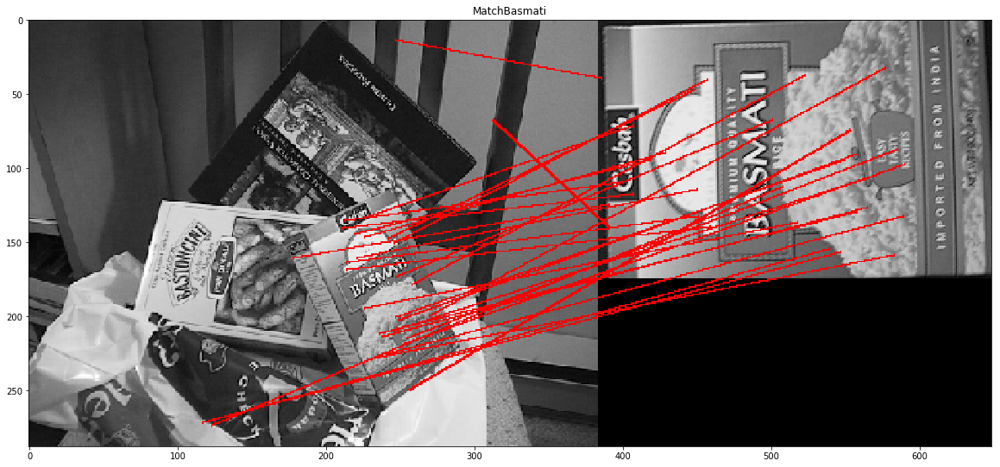

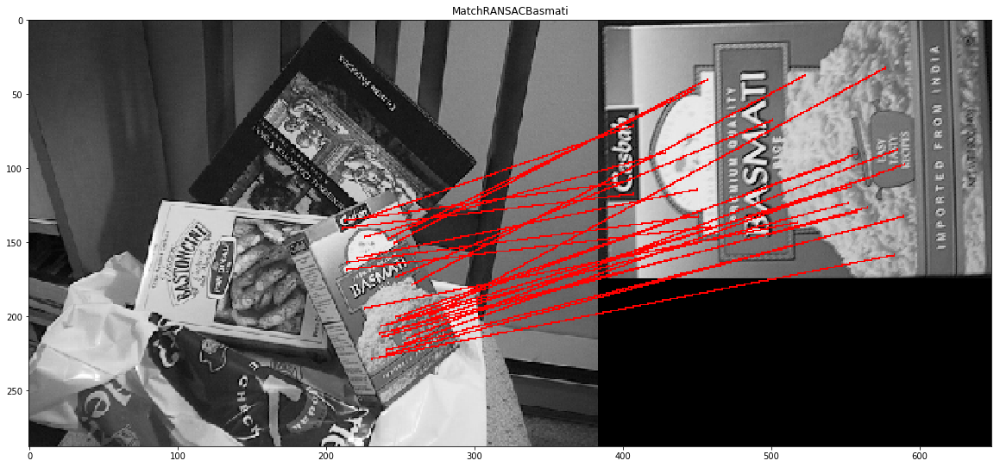

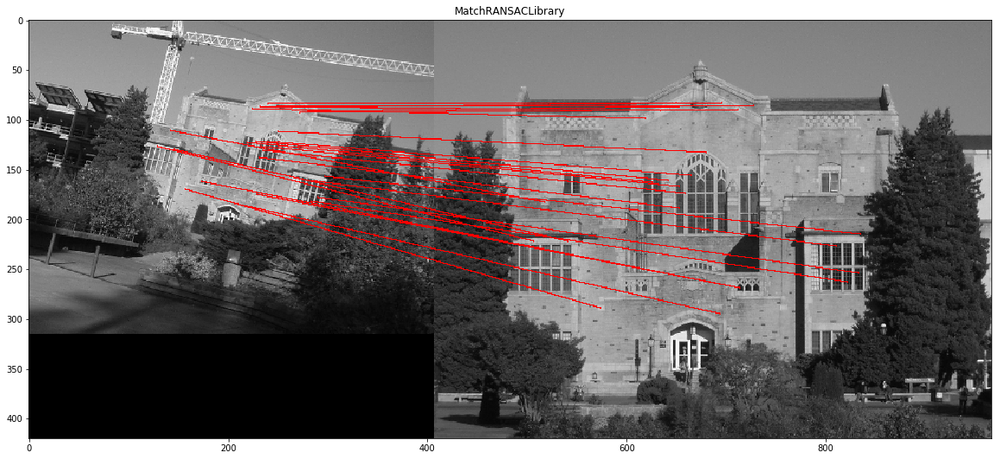

In [15]:
# Test run matching with no ransac on basmati
plt.figure(figsize=(20, 20))
im = Match('./data/scene', './data/basmati', ratio_thres=0.74)
plt.title('MatchBasmati')
plt.imshow(im)

# Test run matching with ransac on basmati
plt.figure(figsize=(20, 20))
im = MatchRANSAC(
    './data/scene', './data/basmati',
    ratio_thres=0.83, orient_agreement=20, scale_agreement=0.2)
plt.title('MatchRANSACBasmati')
plt.imshow(im)

# Test run matching with ransac on library
plt.figure(figsize=(20, 20))
im = MatchRANSAC(
    './data/library2', './data/library',
    ratio_thres=0.75, orient_agreement=10, scale_agreement=0.1)
plt.title('MatchRANSACLibrary')
plt.imshow(im)

**Part 1 Discussion**

Q3.

* **Threshold selection:** the threshold value I selected is 0.74. 
* **I selected this value because** from the first figure we see out of the 33 matched pairs, only 5 are obviously outliers. If we set it higher, such as 0.8, then we get 9 obvious outliers vs. 43 matched pairs, so we have too many outliers. If we set it lower, say 0.70, then we still get 2 obvious incorrect matches, but with only 26 matched pairs, so we have many less possible correct matches. 
* **Setting the threshold correct is important because** if 1) it is too large, then we get a large porportion of incorrect matches, and computational cost of later stages (RANSAC for example) becomes high; but if 2) it is too small, then we may not have enough correct matches, and in later stages we may have a problem with finding a consensus set large enough.

Q4.

* **Effects of consistency checking:** consistency checking further narrows down matched pairs by finding an orientation and scale transformation model (difference in this case) that most pairs agree on, and removing the pairs that do not agree with the model.
* **Effects of the checking on adjusting the matching threshold:** It allows us to use a larger threshold without introducing more incorrect matches. I adjusted the threshold from 0.74 to 0.83. For the book image, if I use 0.83 as the threshold without running RANSAC, I get 54 matched pairs, in which 15 look like incorrect matches; after RANSAC I have only 28 inliers left, and no obvious outliers. So the side effect is that I also removed around 10 possible correct matches.

# Q2: Panorama

In [7]:
import os.path as op

Contents of test_pano.py

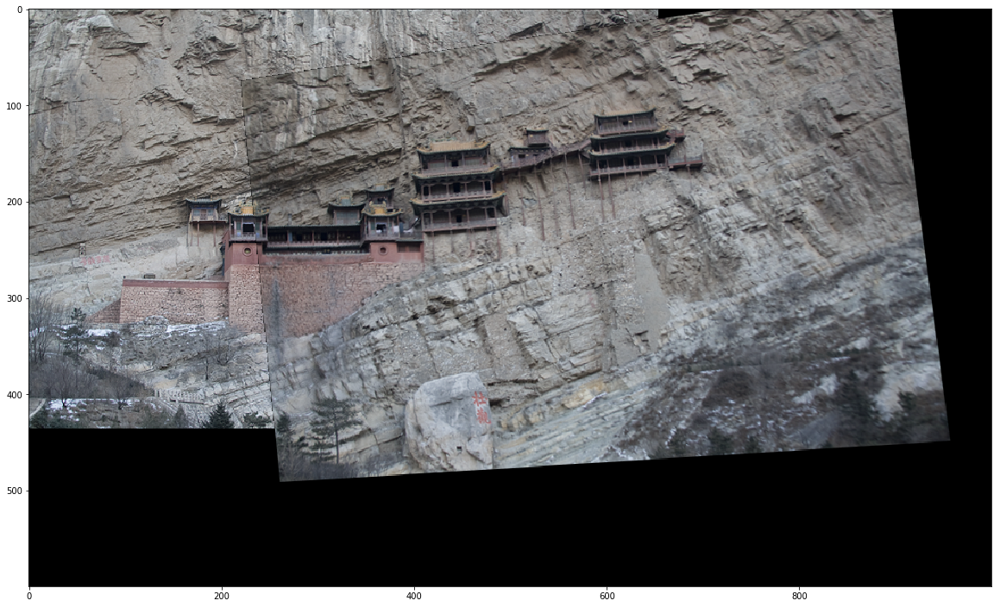

In [8]:
path = './data/'
image_list = ['Hanging1', 'Hanging2']
image_list = [op.join(path, im) for im in image_list]
# the dimension of the canvas (numpy array)
# to which we are copying images.
canvas_width = 1000
canvas_height = 600

# some precomputed data for sanity check
with open('./data/test.pkl', 'rb') as f:
    test_dict = pkl.load(f)
h_gt = test_dict['h']  # the homograph matrix we computed

# matches between the source and the refence image
xy_src = test_dict['xy_src']  # (match, 2)
xy_ref = test_dict['xy_ref']  # (match, 2)

# image_list should store both the reference and the source images
ref_image = image_list[0]  # first element is the reference image
source_image = image_list[1]

# compute the homography matrix to transform the source to the reference
h, _ = cv2.findHomography(xy_src, xy_ref)

# The current computed value should equal to our precomputed one
norm_diff = ((h-h_gt)**2).sum()
assert norm_diff < 1e-7, 'The computed homography matrix should equal to the given one.'

# read the two images as numpy arrays
im_src = np.array(ReadData(source_image)[0])
im_ref = np.array(ReadData(ref_image)[0])

# project source image to the reference image using the homography matrix
# the size of canvas is specified to store all images after projections.
im_src_warp = cv2.warpPerspective(im_src, h, (canvas_width, canvas_height))

# warp_list should contain all images, where the first
# element is the reference image
warp_list = [im_ref, im_src_warp]
result = MergeWarppedImages(canvas_height, canvas_width, warp_list)

# plot the result of the warping
plt.figure(figsize=(20, 20))
plt.imshow(result)
plt.show()

In [9]:
import sys

Contents of main_proj.py

/home/eric/anaconda3/envs/cs425_env/lib/python3.6/site-packages/matplotlib/figure.py:457: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


Press any key to exit the program


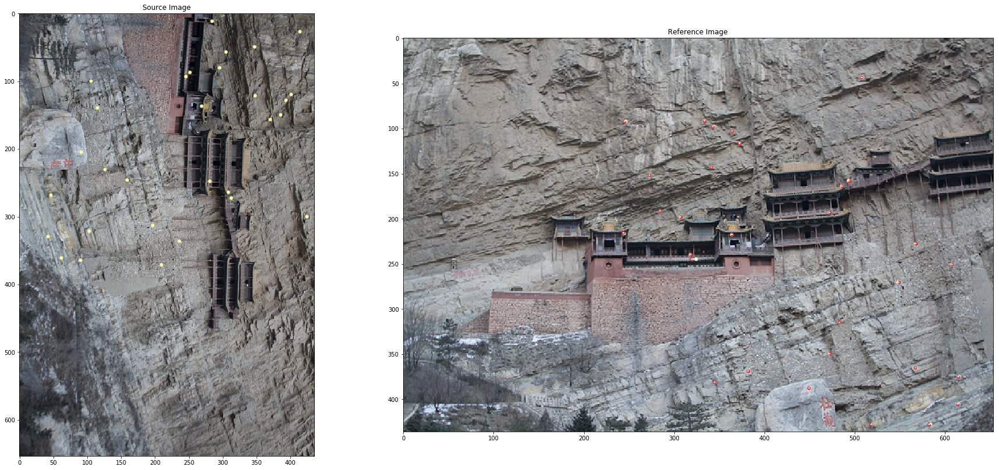

In [10]:
with open('./data/test.pkl', 'rb') as f:
    test_dict = pkl.load(f)

# visualize 30 random matches
num_pts = 30
idx = np.random.permutation(test_dict['xy_src'].shape[0])[:num_pts]
xy_src = test_dict['xy_src'][idx]
xy_ref = test_dict['xy_ref'][idx]
h = test_dict['h']

# project the src keypoints to the reference frame using homography
xy_proj = KeypointProjection(xy_src, h)

# visualize the results
im_ref = np.array(Image.open('./data/Hanging1.png'))
im_src = np.array(Image.open('./data/Hanging2.png'))
VisualizePointProj(xy_src, xy_ref, xy_proj, im_src, im_ref)

Contents of main_pano.py

In [11]:
def create_pano(
        image_list, ratio_thres,
        canvas_height, canvas_width,
        num_iter, tol, figsize=(20, 20)):
    """
    This function creates a panorama using a list of images.
    Inputs:
        image_list: a list of str, the path to each image (without file extensions).
        ratio_thres: the ratio test threshold in `FindBestMatches`
        canvas_height, canvas_width: The dimension of the canvas
        num_iter: num of iterations of performing RANSAC to find the homography matrix.
        tol: tolerance for keypoint projection
    """
    # Get the matches from `FindBestMatches`
    # xy_src_list: np.array, (matches, 2) in xy format
    # xy_ref_list: np.array, (matches, 2) in xy format
    # im_list: a list of images in np.array
    xy_src_list, xy_ref_list, im_list = PrepareData(
        image_list, ratio_thres)

    # Use the matches to estimate a homography matrix to the ref image frame
    # for each source image. Then project each source image to the reference
    # frame using the homography matrix.
    wrap_list = ProjectImages(
        xy_src_list, xy_ref_list, im_list,
        canvas_height, canvas_width, num_iter, tol)

    # Merge the projected images above
    # Note: the first element is the reference image in warp_list
    result = MergeWarppedImages(
        canvas_height, canvas_width, wrap_list)

    # show the final panorama
    plt.figure(figsize=figsize)
    plt.imshow(result)
    plt.show()

Showing results with num_iter = 1, tol = 2
number of matched pairs: 507
number of matched pairs: 338
number of matched pairs: 200
number of matched pairs: 590
number of matched pairs: 229
largest set size: 425
largest set size: 6
largest set size: 78
largest set size: 19
largest set size: 4


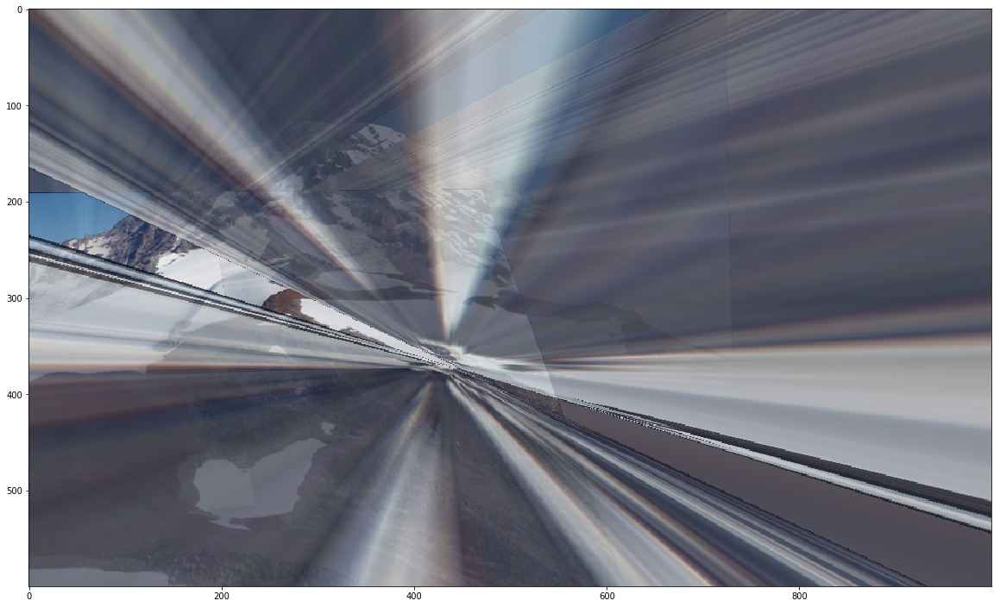

Showing results with num_iter = 2, tol = 2
number of matched pairs: 507
number of matched pairs: 338
number of matched pairs: 200
number of matched pairs: 590
number of matched pairs: 229
largest set size: 369
largest set size: 241
largest set size: 4
largest set size: 8
largest set size: 5


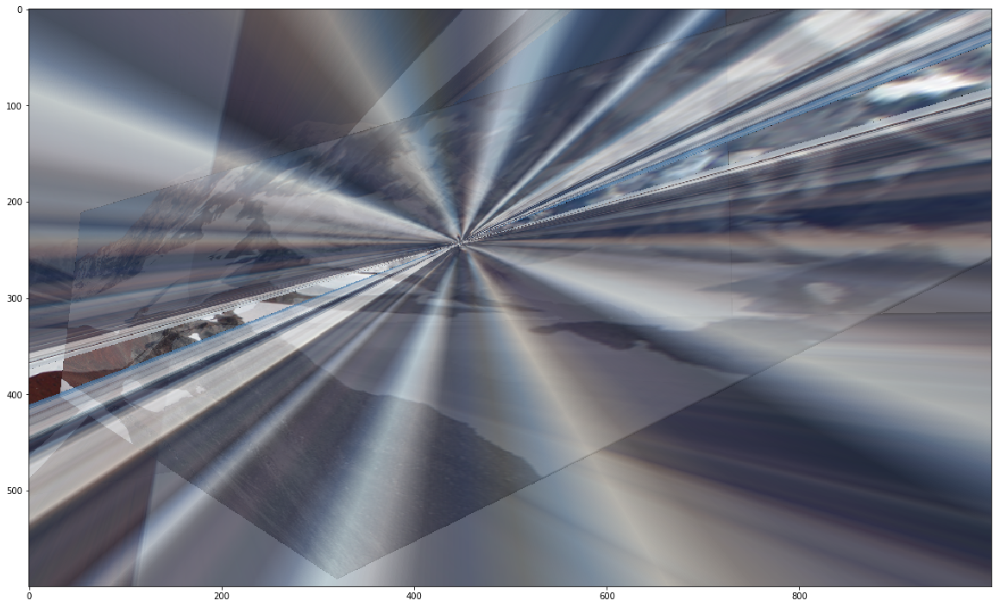

Showing results with num_iter = 10, tol = 2
number of matched pairs: 507
number of matched pairs: 338
number of matched pairs: 200
number of matched pairs: 590
number of matched pairs: 229
largest set size: 446
largest set size: 234
largest set size: 41
largest set size: 427
largest set size: 58


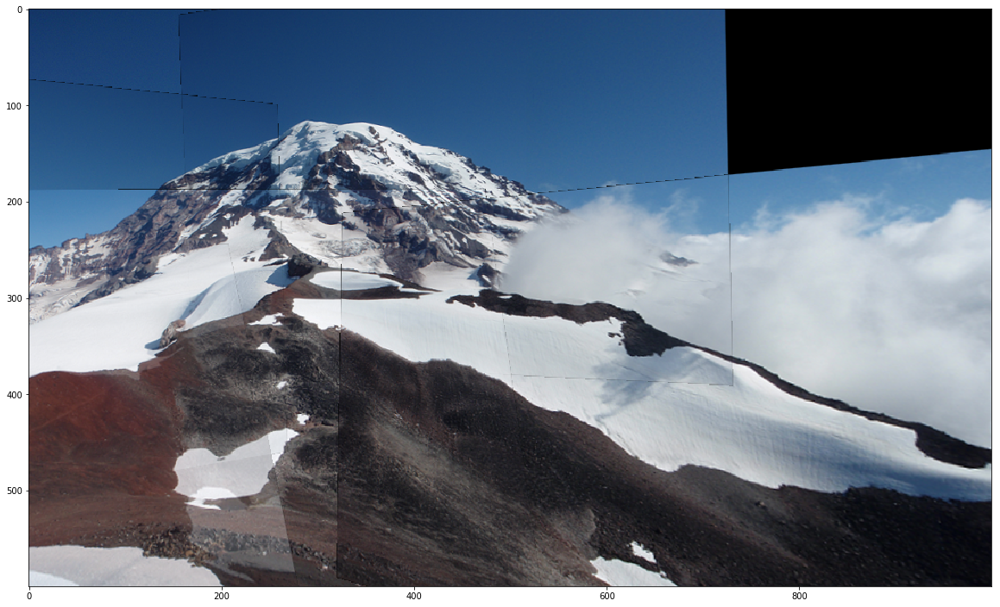

Showing results with num_iter = 40, tol = 2
number of matched pairs: 507
number of matched pairs: 338
number of matched pairs: 200
number of matched pairs: 590
number of matched pairs: 229
largest set size: 445
largest set size: 264
largest set size: 55
largest set size: 450
largest set size: 129


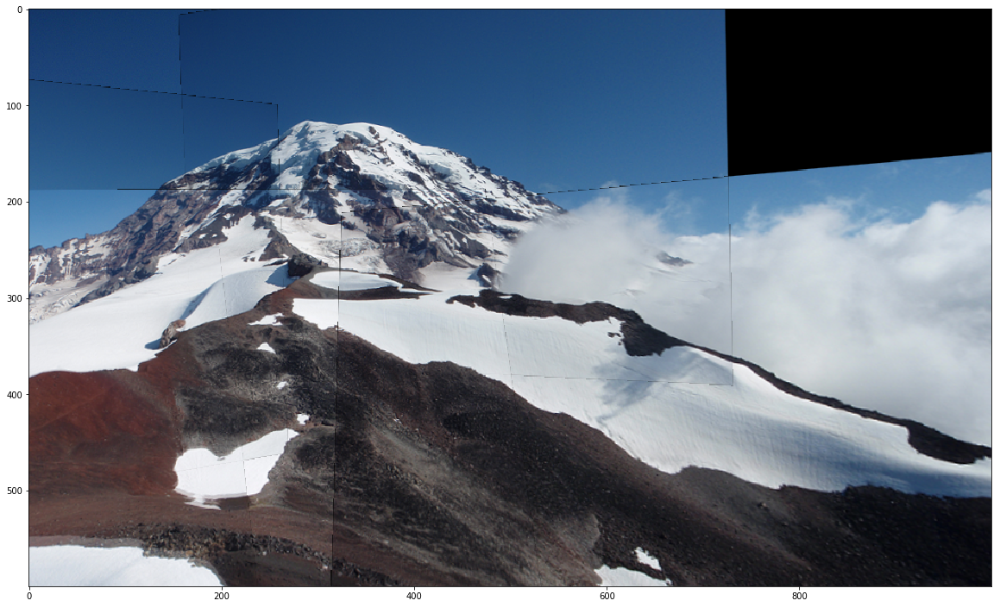

Showing results with num_iter = 10, tol = 0.1
number of matched pairs: 507
number of matched pairs: 338
number of matched pairs: 200
number of matched pairs: 590
number of matched pairs: 229
largest set size: 105
largest set size: 21
largest set size: 7
largest set size: 83
largest set size: 11


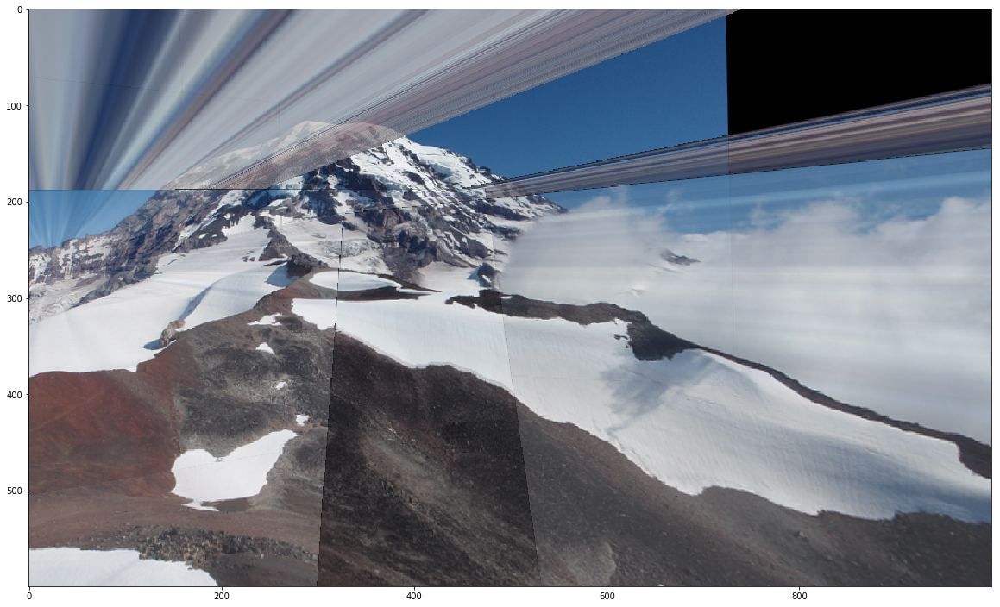

Showing results with num_iter = 10, tol = 1
number of matched pairs: 507
number of matched pairs: 338
number of matched pairs: 200
number of matched pairs: 590
number of matched pairs: 229
largest set size: 432
largest set size: 257
largest set size: 55
largest set size: 224
largest set size: 87


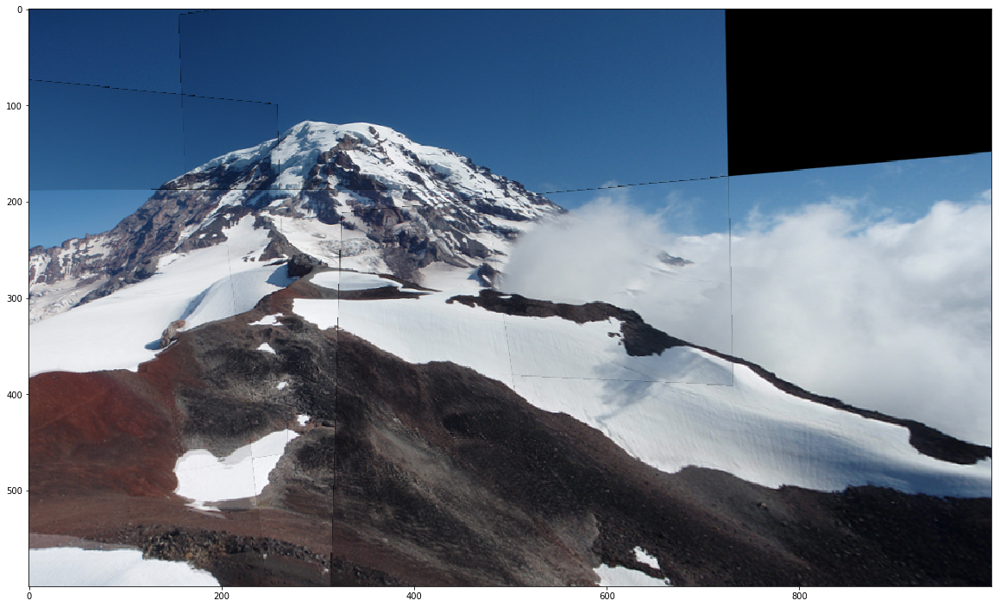

Showing results with num_iter = 10, tol = 2
number of matched pairs: 507
number of matched pairs: 338
number of matched pairs: 200
number of matched pairs: 590
number of matched pairs: 229
largest set size: 446
largest set size: 264
largest set size: 20
largest set size: 450
largest set size: 62


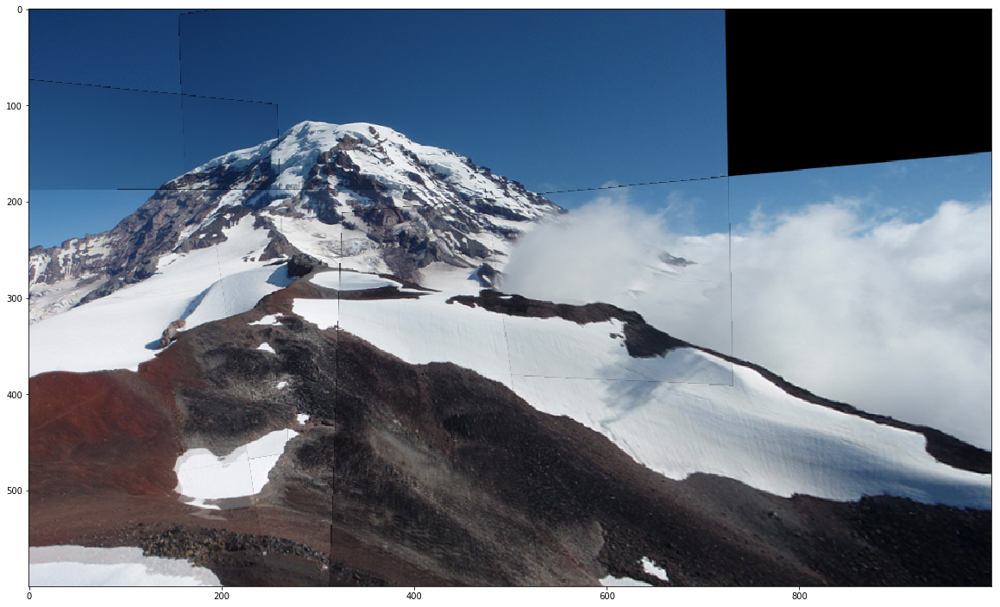

Showing results with num_iter = 10, tol = 5
number of matched pairs: 507
number of matched pairs: 338
number of matched pairs: 200
number of matched pairs: 590
number of matched pairs: 229
largest set size: 448
largest set size: 264
largest set size: 10
largest set size: 323
largest set size: 12


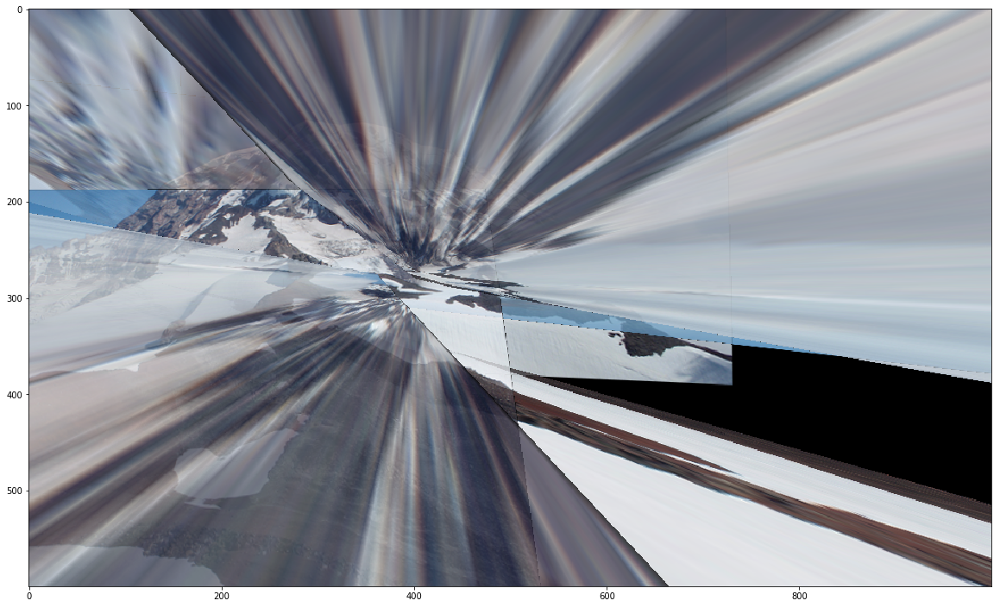

In [12]:
def create_and_display_pano(num_iter, tol):
    """
    Create and display the Rainier panorama with given
    num_iter and tol.
    """
    path = './data/'
    canvas_height = 600
    canvas_width = 1000
    image_list = ['Rainier1', 'Rainier2', 'Rainier3','Rainier4','Rainier5','Rainier6'] 
    print(f"Showing results with num_iter = {num_iter}, tol = {tol}")
    ratio_thres = 0.9
    image_list = [op.join(path, im) for im in image_list]
    create_pano(image_list, ratio_thres, canvas_height, canvas_width,
                num_iter, tol, figsize=(20, 20))
    return   

# we vary num_iter while keeping tol constant
create_and_display_pano(1, 2)
create_and_display_pano(2, 2)
create_and_display_pano(10, 2)
create_and_display_pano(40, 2)

# we vary tol while keeping num_ter constant
create_and_display_pano(10, 0.1)
create_and_display_pano(10, 1)
create_and_display_pano(10, 2)
create_and_display_pano(10, 5)

**Part 2 Discussion**

Q4. 

* **Effects of `num_iter`:** this variable controls the number of samples of 4 matched pairs we draw. For the "Rainier" image, we notice from our experiment above that the rendering quality is pretty bad for low `num_iter` (1 or 2 iterations), and the quality becomes better as we move to higher values. Setting it too small leads to bad rendering quality because if we have a portition of matched pairs being incorrect matches, then for the few times we sample, we might have sampled these incorrect pairs, thus the model we construct from the pairs would not fit well to all matched pairs. As we sample more times, we are more likely to get a sample with all pairs being correct matches, so we can fit a better model. On the other hand, setting it too large would lead to increased computational cost, and in fact would not be necessary if the proportion of correct matches is high.
* **Effects of `tol`:** this parameter controls the distance tolerance we have for establishing the support of a model. So it more specifically controls number of pairs we put in a consensus set (i.e. consider as inliers) on each iteration. Setting it lower means we may consider fewer pairs as inliers, and the support of our model on each fit would be smaller. If this value is set too low, the model we fit will not be very tolerant to noise. If this value is set too large, then the model would not fit well either, because we fit to many pairs which should be outliers. As we can see from the "Rainier" case, when `tol` is very low (0.1) or very high (5), we get bad rendering quality, and we only get good rendering quality when `tol` is 1 and 2.

number of matched pairs: 160
largest set size: 132


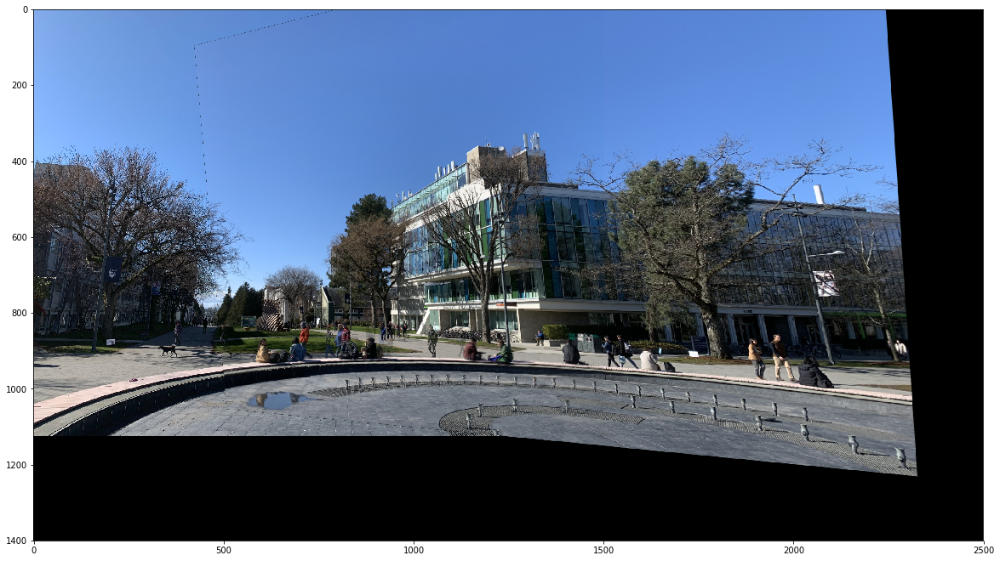

number of matched pairs: 55
number of matched pairs: 67
largest set size: 38
largest set size: 47


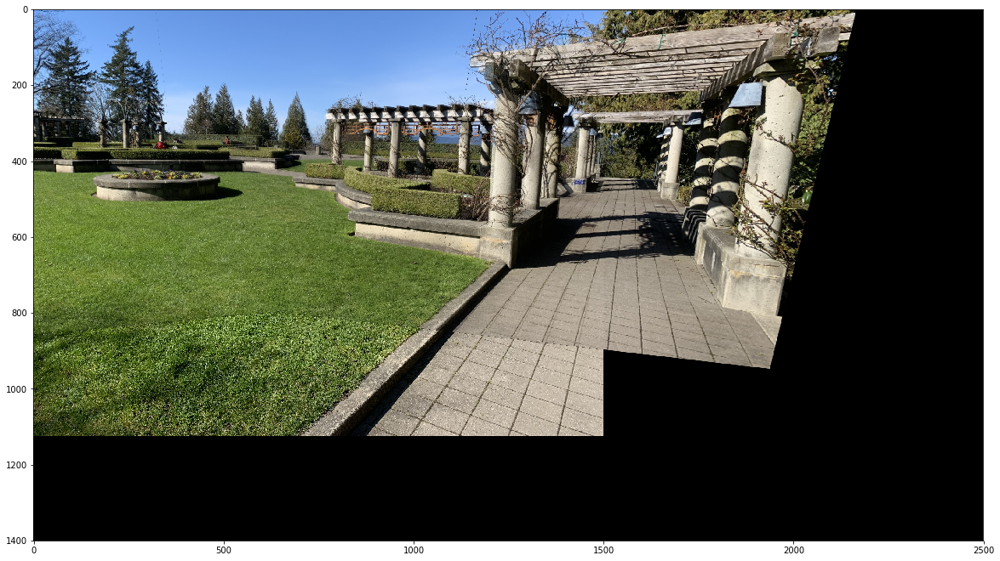

number of matched pairs: 181
number of matched pairs: 193
largest set size: 98
largest set size: 152


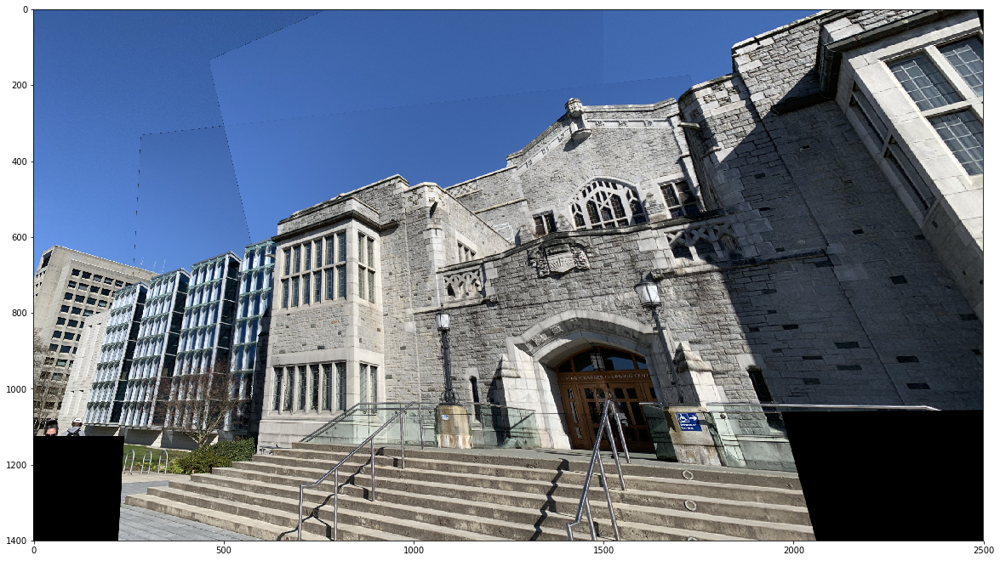

In [64]:
# fountain
path = './data/'

canvas_height = 1400
canvas_width = 2500
image_list = ['fountain4', 'fountain0']

num_iter = 40
tol = 3
ratio_thres = 0.6
image_list = [op.join(path, im) for im in image_list]
create_pano(image_list, ratio_thres, canvas_height, canvas_width,
            num_iter, tol, figsize=(20, 20))

# garden
path = './data/'

canvas_height = 1400
canvas_width = 2500
image_list = ['garden0', 'garden3', 'garden4']

num_iter = 100
tol = 6
ratio_thres = 0.6
image_list = [op.join(path, im) for im in image_list]
create_pano(image_list, ratio_thres, canvas_height, canvas_width,
            num_iter, tol, figsize=(20, 20))

# irving
path = './data/'

canvas_height = 1400
canvas_width = 2500
image_list = ['irving_out3', 'irving_out6', 'irving_out5']

num_iter = 50
tol = 10
ratio_thres = 0.7
image_list = [op.join(path, im) for im in image_list]
create_pano(image_list, ratio_thres, canvas_height, canvas_width,
            num_iter, tol, figsize=(20, 20))